
# Prediction of PFAS Compounds Concentrations

## Introduction

This notebook explores the use of machine learning (ML) models to predict the future concentrations of specific PFAS compounds (PFHxA, PFHxS, PFOA, PFOSA and PFOS) in water samples. These predictions can help in understanding potential future impacts on human health, considering the toxicological profiles of these compounds.

PFAS (Per- and polyfluoroalkyl substances) have been widely used in various industrial and consumer products for their resistance to water, oil, temperature, and stains. However, they are persistent in the environment and human body, and exposure to high levels of certain PFAS compounds has been associated with various adverse health effects.

## Dataset Overview

The dataset comprises measurements from water samples, detailing concentrations of PFHxA, PFHxS, PFOA, PFOSA and PFOS. This analysis aims to predict these concentrations based on available features within the dataset, using machine learning techniques.

## Machine Learning Approach

The approach will involve:

1. Data preprocessing: Handling missing values, feature selection, and data splitting.
2. Model selection: Comparing different regression models to predict the concentration levels.
3. Evaluation: Assessing model performance using appropriate metrics.
4. Health impact analysis: Discussing the potential effects on human health based on predicted concentration levels of PFAS compounds.

Let's begin by importing necessary libraries and loading the dataset.


In [1]:

import pandas as pd
import missingno as msno
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style='whitegrid')


In [2]:

# Load the dataset
file_path = '/content/PFAS_Surface_Water_Sampling.csv'
df = pd.read_csv(file_path, on_bad_lines='skip')

df.shape

(1931, 173)

In [3]:
# Location of Sample - features
features = ['X', 'Y', 'CollectionDate','Watershed','Waterbody']
targets = ['CAS307244_PFHxA', 'CAS355464_PFHxS', 'CAS335671_PFOA', 'CAS1763231_PFOS']


In [4]:
# PFAS compounds
# Preprocess the dataset to focus on relevant features and PFAS compounds

compound_names = ["CAS307244_PFHxA", "CAS355464_PFHxS", "CAS335671_PFOA", "CAS1763231_PFOS"]

df_0 = df[targets + features].copy()

df_0.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1931 entries, 0 to 1930
Data columns (total 9 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   CAS307244_PFHxA  1930 non-null   float64
 1   CAS355464_PFHxS  1930 non-null   float64
 2   CAS335671_PFOA   1930 non-null   float64
 3   CAS1763231_PFOS  1930 non-null   float64
 4   X                1931 non-null   float64
 5   Y                1931 non-null   float64
 6   CollectionDate   1931 non-null   object 
 7   Watershed        1931 non-null   object 
 8   Waterbody        1930 non-null   object 
dtypes: float64(6), object(3)
memory usage: 135.9+ KB


In [5]:
# Extracting year from CollectionDate and renaming the column to CollectionYear
df_0.loc[:, 'CollectionYear'] = pd.to_datetime(df_0['CollectionDate']).dt.year
df_0.shape

(1931, 10)

In [40]:
df_0.head()


,CAS307244_PFHxA,CAS355464_PFHxS,CAS335671_PFOA,CAS1763231_PFOS,X,Y,CollectionDate,Watershed,Waterbody,CollectionYear
0,67.0,250.0,120.0,660.0,-83.390600,44.438100,2020/02/03 00:00:00+00,Au Sable,Clark's Marsh,2020
1,1.0,1.0,1.0,1.0,-83.373655,44.507457,2021/09/01 00:00:00+00,Au Sable,Simpson Lake,2021
2,2.0,2.0,2.0,2.0,-83.434334,44.436653,2022/09/08 00:00:00+00,Au Sable,Au Sable River,2022
3,2.0,2.0,0.9,0.5,-83.417901,44.511668,2022/09/08 00:00:00+00,Au Sable,Hill Creek,2022
4,2.0,1.2,2.0,2.0,-84.704890,44.664420,2022/09/07 00:00:00+00,Au Sable,Au Sable River,2022


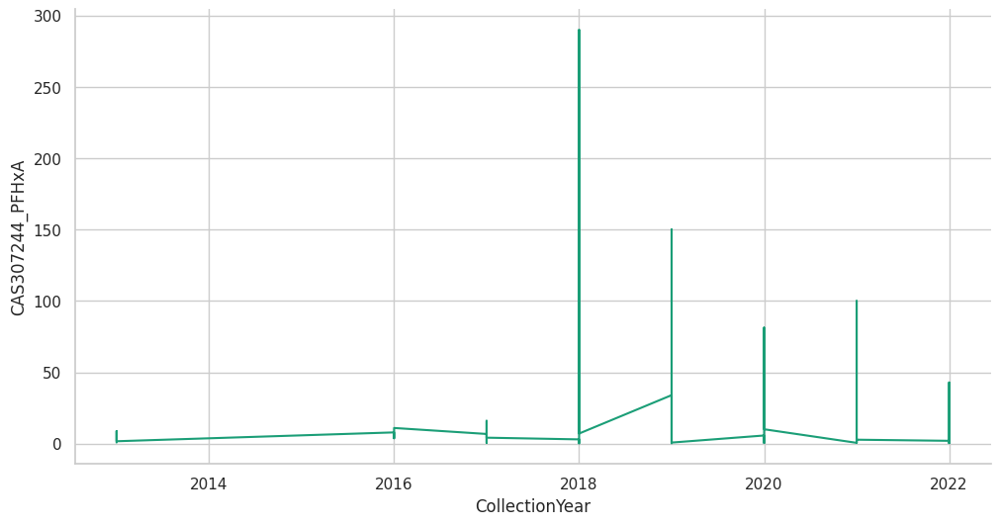

In [42]:
#Plot showing the concentration of the compound CAS307244_PFHxA over the years.

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['CollectionYear']
  ys = series['CAS307244_PFHxA']

  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = df_0.sort_values('CollectionYear', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('CollectionYear')
_ = plt.ylabel('CAS307244_PFHxA')

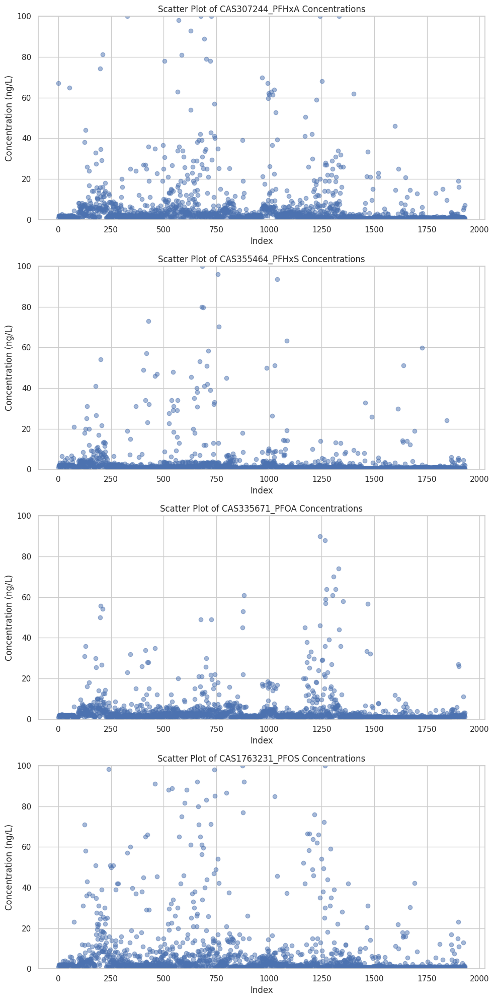

In [43]:
# Visualization of compound concentrations as scatter plots
fig, ax = plt.subplots(len(compound_names), 1, figsize=(10, 5 * len(compound_names)))

for i, compound in enumerate(compound_names):
    ax[i].scatter(df_selected.index, df_selected[compound], alpha=0.5)
    ax[i].set_title(f'Scatter Plot of {compound} Concentrations')
    ax[i].set_xlabel('Index')
    ax[i].set_ylabel('Concentration (ng/L)')
    ax[i].set_ylim(0, 100)  # Set y-axis limits up to 100 ng/L

plt.tight_layout()
plt.show()


In [11]:
import plotly.graph_objects as go

# Calculate median and quartiles for each compound
compound_stats = df_selected[compound_names].describe().loc[['25%', '50%', '75%']].T

# Define colors for each compound
colors = ['blue', 'green', 'orange', 'red']

# Create dumbbell chart
fig = go.Figure()

for i, compound in enumerate(compound_names):
    # Calculate median, lower quartile, and upper quartile
    median = compound_stats.loc[compound, '50%']
    q1 = compound_stats.loc[compound, '25%']
    q3 = compound_stats.loc[compound, '75%']

    # Add trace for dumbbell chart
    fig.add_trace(go.Scatter(x=[q1, median, q3], y=[compound, compound, compound],
                             mode='lines+markers', name=compound,
                             line=dict(color=colors[i], width=2),
                             marker=dict(color=colors[i], size=10)))

# Update layout
fig.update_layout(
    title="Dumbbell Chart of Compound Concentrations",
    xaxis_title="Concentration (ng/L)",
    yaxis_title="Compound",
    showlegend=False,
    height=400,
    width=800
)

# Show plot
fig.show()


## Display locations of samples collected - highlight total number of samples

In [12]:
import plotly.express as px

# List of compounds
compounds = ["CAS307244_PFHxA", "CAS355464_PFHxS", "CAS335671_PFOA", "CAS1763231_PFOS"]

# Melt DataFrame to long format for easier plotting
df_melted = df_selected.melt(id_vars=['X', 'Y', 'Watershed'], value_vars=compounds,
                              var_name='Compound', value_name='Concentration')

# Remove rows with NaN values in the Concentration column
df_melted = df_melted.dropna(subset=['Concentration'])

# Create scatter plot for geographical distribution of concentrations with facetting by compounds
fig = px.scatter(df_melted, x='X', y='Y', color='Compound',
                 hover_name='Watershed', color_discrete_sequence=px.colors.qualitative.Set1,
                 size_max=30, facet_col='Compound', facet_col_wrap=2)

# Update layout
fig.update_layout(
    title="Geographical Distribution of Compound Concentrations",
    xaxis_title="Longitude",
    yaxis_title="Latitude",
    coloraxis_colorbar_title="Compound",
)

# Show plot
fig.show()


In [16]:
import folium
from folium.plugins import HeatMap

# Create a Folium map centered at the mean latitude and longitude
map_center = [df_selected['Y'].mean(), df_selected['X'].mean()]
mymap = folium.Map(location=map_center, zoom_start=10)

# Create a list of tuples containing latitude, longitude, and compound concentration for each point
heat_data = []
for index, row in df_selected.iterrows():
    for compound in compounds:
        if not pd.isnull(row[compound]):  # Check if compound concentration is not NaN
            heat_data.append([row['Y'], row['X'], row[compound]])

# Add the heatmap layer to the map
HeatMap(heat_data).add_to(mymap)

# Display the map
mymap


In [13]:
import folium
from folium.plugins import MarkerCluster

# Create a Folium map centered at the mean latitude and longitude
map_center = [df_selected['Y'].mean(), df_selected['X'].mean()]
mymap = folium.Map(location=map_center, zoom_start=10)

# Create a MarkerCluster layer for the scatter plot markers
marker_cluster = MarkerCluster().add_to(mymap)

# Add scatter plot markers for each row in the DataFrame
for index, row in df_selected.iterrows():
    folium.Marker([row['Y'], row['X']], popup=row['Watershed']).add_to(marker_cluster)

# Display the map
mymap


In [14]:
import folium
from folium.plugins import MarkerCluster

# Create a Folium map centered at the mean latitude and longitude
map_center = [df_selected['Y'].mean(), df_selected['X'].mean()]
mymap = folium.Map(location=map_center, zoom_start=10)

# Create a MarkerCluster layer for the scatter plot markers
marker_cluster = MarkerCluster().add_to(mymap)

# Define colors for each compound
compound_colors = {
    "CAS307244_PFHxA": "red",
    "CAS355464_PFHxS": "blue",
    "CAS335671_PFOA": "green",
    "CAS1763231_PFOS": "orange"
}

# Add scatter plot markers for each compound
for compound in compound_colors:
    compound_df = df_selected.dropna(subset=[compound])
    for index, row in compound_df.iterrows():
        folium.Marker([row['Y'], row['X']],
                      popup=f"{compound}: {row[compound]} ng/L",
                      icon=folium.Icon(color=compound_colors[compound])).add_to(marker_cluster)

# Display the map
mymap


## Exploratory Data Analysis

In [7]:
#Missing values
df_0.isna().sum()


CAS307244_PFHxA    1
CAS355464_PFHxS    1
CAS335671_PFOA     1
CAS1763231_PFOS    1
X                  0
Y                  0
CollectionDate     0
Watershed          0
Waterbody          1
CollectionYear     0
dtype: int64

In [8]:
df_selected = df_0.dropna()
df_selected.shape

(1927, 10)

In [19]:
df_selected.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1927 entries, 0 to 1930
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   CAS307244_PFHxA  1927 non-null   float64
 1   CAS355464_PFHxS  1927 non-null   float64
 2   CAS335671_PFOA   1927 non-null   float64
 3   CAS1763231_PFOS  1927 non-null   float64
 4   X                1927 non-null   float64
 5   Y                1927 non-null   float64
 6   CollectionDate   1927 non-null   int64  
 7   Watershed        1927 non-null   object 
 8   Waterbody        1927 non-null   object 
 9   CollectionYear   1927 non-null   int32  
dtypes: float64(6), int32(1), int64(1), object(2)
memory usage: 158.1+ KB


In [44]:
# Feature engineering: Convert 'CollectionDate' to numerical feature representing days
df_selected.loc[:, 'CollectionDate'] = pd.to_datetime(df_selected['CollectionDate']).map(pd.Timestamp.toordinal)

# Combine encoded features with numerical features
X = df_selected.loc[:, ['X', 'Y', 'CollectionDate']]

# Extract targets
y = df_selected[targets]


In [45]:
df_selected.head()

,CAS307244_PFHxA,CAS355464_PFHxS,CAS335671_PFOA,CAS1763231_PFOS,X,Y,CollectionDate,Watershed,Waterbody,CollectionYear
0,67.0,250.0,120.0,660.0,-83.390600,44.438100,719163,Au Sable,Clark's Marsh,2020
1,1.0,1.0,1.0,1.0,-83.373655,44.507457,719163,Au Sable,Simpson Lake,2021
2,2.0,2.0,2.0,2.0,-83.434334,44.436653,719163,Au Sable,Au Sable River,2022
3,2.0,2.0,0.9,0.5,-83.417901,44.511668,719163,Au Sable,Hill Creek,2022
4,2.0,1.2,2.0,2.0,-84.704890,44.664420,719163,Au Sable,Au Sable River,2022


In [22]:
df_selected.shape,X.shape,y.shape

((1927, 10), (1927, 3), (1927, 4))

In [23]:
# Splitting the dataset into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardizing features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


In [29]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

# Define a pipeline with StandardScaler and LinearRegression
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('regressor', LinearRegression())
])

# Define hyperparameters to tune
param_grid = {
    'regressor__fit_intercept': [True, False],
    'regressor__positive': [True, False],
    'regressor__n_jobs': [-1, None],
    'regressor__copy_X': [True, False],
}

# Perform Grid Search Cross-Validation
grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)

# Best parameters and best score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

print("Best Parameters:", best_params)
print("Best Negative MSE:", best_score)



Best Parameters: {'regressor__copy_X': True, 'regressor__fit_intercept': True, 'regressor__n_jobs': -1, 'regressor__positive': True}
Best Negative MSE: -27708.704608745786


In [ ]:

from sklearn.model_selection import GridSearchCV

# Hyperparameter grid
param_grid = {
    'n_estimators': [50, 100, 150],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth': [10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Initialize the base model
rf = RandomForestRegressor(random_state=42)

# Grid search for hyperparameter tuning
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=3, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')

# Fit the grid search to the data
grid_search.fit(X_train_scaled, y_train)

# Best parameters and model
best_params = grid_search.best_params_
best_grid = grid_search.best_estimator_

# Predictions with the best model
predictions_best = best_grid.predict(X_test_scaled)

# Evaluation
mse_best = mean_squared_error(y_test, predictions_best, multioutput='raw_values')
mae_best = mean_absolute_error(y_test, predictions_best, multioutput='raw_values')
r2_best = r2_score(y_test, predictions_best, multioutput='raw_values')

best_results = {
    'Best MSE': mse_best,
    'Best MAE': mae_best,
    'Best R2': r2_best
}

best_params, pd.DataFrame(best_results, index=["PFHxA","PFHxS", "PFOA", "PFOS"])


Fitting 3 folds for each of 243 candidates, totalling 729 fits


({'max_depth': 10,
  'max_features': 'sqrt',
  'min_samples_leaf': 4,
  'min_samples_split': 2,
  'n_estimators': 100},
             Best MSE    Best MAE   Best R2
 PFHxA     119.179310    4.491053  0.284525
 PFHxS     173.340146    4.430776  0.292525
 PFOA    14624.302482   18.104929  0.319409
 PFOS   551434.450327  104.672318  0.141294)

In [46]:
# Importing necessary libraries
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error
import pandas as pd

# Initializing models
models = {
    'LinearRegression': LinearRegression(),
    'RandomForestRegressor': RandomForestRegressor()
}

results = {}

# Training and evaluating each model
for name, model in models.items():
    model.fit(X_train_scaled, y_train)
    predictions = model.predict(X_test_scaled)
    mse = mean_squared_error(y_test, predictions, multioutput='raw_values')
    mae = mean_absolute_error(y_test, predictions, multioutput='raw_values')
    r2 = r2_score(y_test, predictions, multioutput='raw_values')
    results[name] = {'MSE': mse, 'MAE': mae, 'R2': r2}

results_df = pd.DataFrame(results).T

# Printing results in a tidy way
print(results_df.to_string())


                                                                                                  MSE                                                                            MAE                                                                                          R2
LinearRegression        [161.21628632789398, 243.1262702080294, 21553.70352245859, 642731.7793747254]   [6.442423179032616, 6.519473404169257, 20.70031180606114, 117.8224179961965]  [0.032162479736100424, 0.007698298833605399, -0.0030741355437573503, -0.00087599195745236]
RandomForestRegressor  [111.91807264899336, 183.16260139557863, 5059.217660845341, 404675.6339303913]  [4.108331816134948, 3.5934249637127595, 9.447424541405628, 79.30985677551936]          [0.32811682757032223, 0.25243553154753895, 0.7645522786192022, 0.3698302471909505]


In [47]:
#Adding parameters as per the grid search

from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import pandas as pd

# Initializing models with best parameters
linear_regression = LinearRegression(copy_X=True, fit_intercept=True, n_jobs=-1, positive=True)
random_forest_regressor = RandomForestRegressor(max_depth=10, max_features='sqrt', min_samples_leaf=4,
                                                 min_samples_split=2, n_estimators=100, random_state=42)

models = {
    'LinearRegression': linear_regression,
    'RandomForestRegressor': random_forest_regressor
}

results = {}

# Training and evaluating each model
for name, model in models.items():
    model.fit(X_train_scaled, y_train)
    predictions = model.predict(X_test_scaled)
    mse = mean_squared_error(y_test, predictions, multioutput='raw_values')
    mae = mean_absolute_error(y_test, predictions, multioutput='raw_values')
    r2 = r2_score(y_test, predictions, multioutput='raw_values')
    results[name] = {'MSE': mse, 'MAE': mae, 'R2': r2}

results_df = pd.DataFrame(results).T

# Printing results in a tidy way
print(results_df.to_string())


                                                                                                   MSE                                                                              MAE                                                                                            R2
LinearRegression        [162.5518703571533, 247.55310945104094, 21601.117236893842, 643102.1439333082]  [6.318734389909257, 6.5742632302763795, 20.556948040089114, 116.32381609209226]  [0.024144503609585977, -0.010369514685155234, -0.005280692322758407, -0.0014527317528894024]
RandomForestRegressor  [107.99046095737279, 175.08996243503913, 14664.574375585193, 552311.2584111982]  [4.3618490928849365, 4.183975579830186, 18.345389567278964, 105.51552193365876]             [0.35169564858624736, 0.2853834041348631, 0.3175346756727889, 0.1399288219895436]



## Health Impact Analysis

The model's predictions for PFHxA, PFHxS, PFOA and PFOS concentrations can guide potential health impact assessments. Generally, higher concentrations of these compounds are linked to adverse health outcomes, including developmental effects in infants, changes in liver function, increased cholesterol levels, and potential carcinogenic effects.

Specific health implications can be determined based on the concentration thresholds identified in toxicological studies and guidelines provided by health authorities. For example, [the Environmental Protection Agency (EPA) in the United States has established health advisories for PFOA and PFOS levels in drinking water.](https://cfpub.epa.gov/si/si_public_record_report.cfm?dirEntryId=341170&Lab=NHEERL)

The predictions made by our model can help in assessing risk levels in different water sources and guiding necessary interventions to reduce exposure.
